<a href="https://colab.research.google.com/github/unicamp-dl/IA025_2022S1/blob/main/Final_project/Larissa_Santesso/entrega_02/ViT_T5base_dsetComplete_exp001.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Wandb

In [ ]:
!pip install wandb -qqq

In [ ]:
# Log in to your W&B account
import wandb
wandb.login()

wandb: Currently logged in as: larissa_santesso. Use `wandb login --relogin` to force relogin


True

In [ ]:
# Configuration of the experiment of this notebook (used in variables along code and config of W&B)
config_exp={
        "learning_rate": 1e-5,
        "batch_size": 30,
        "architecture": "Vit_768dm_T5_base_768dm",
        "dataset": "MS-COCO Complete",
        "epochs": 50,
        "eval_epochs": 5,
        "max_seq_length": 32,
        "encoder_pretrained_model": "google/vit-base-patch16-224-in21k",
        "decoder_pretrained_model": "t5-base",
        "path_save_model":  "/content/gdrive/MyDrive/Colab Notebooks/Projeto/modelos/model_ViT_T5base_dsetComplete_exp001.pt",
        "path_save_checkpoints":  "/content/gdrive/MyDrive/Colab Notebooks/Projeto/checkpoints/",
        "checkpoint_folder_name": "checkpoint_ViT_T5base_dsetComplete_exp001.tar"

}



run = "Vit_T5base_dsetComplete_exp001"
#run_id = None
run_id = '9q82bswx'

# Installing and importing libraries


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install sentencepiece

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install sacrebleu

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from transformers import ViTFeatureExtractor, ViTModel, ViTConfig
from transformers import T5ForConditionalGeneration, T5Tokenizer
import datasets

from pycocotools.coco import COCO
import matplotlib
from matplotlib import pyplot as plt

from typing import Any, Callable, Optional, Tuple, List
import math
import random
import numpy as np
import h5py, json
from PIL import Image
import os
import time

import torch
from torch import nn
from torchvision import transforms
from torch.utils.data import DataLoader

import collections
import itertools
import functools
from tqdm.notebook import tqdm

In [ ]:
random.seed(123)
np.random.seed(123)
torch.manual_seed(123)

In [ ]:
# Check which GPU we are using
!nvidia-smi

Wed Jul  6 22:37:03 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
if torch.cuda.is_available(): 
   dev = "cuda:0"
else: 
   dev = "cpu"
device = torch.device(dev)
print('Using {}'.format(device))

Using cuda:0


# Dataset: MS-COCO

## Reduced Dataset

In [ ]:
# Uncomment lines below to download reduced dataset
#!wget -nc https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TRAIN_IMAGES_coco_5_cap_per_img.hdf5
#!wget -nc https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TRAIN_CAPTIONS_coco_5_cap_per_img.json
#!wget -nc https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/VAL_IMAGES_coco_5_cap_per_img.hdf5
#!wget -nc https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/VAL_CAPTIONS_coco_5_cap_per_img.json
#!wget -nc https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TEST_IMAGES_coco_5_cap_per_img.hdf5

--2022-07-02 11:28:54--  https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TRAIN_IMAGES_coco_5_cap_per_img.hdf5
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.141.128, 173.194.210.128, 173.194.211.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.141.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4624222304 (4.3G) [application/octet-stream]
Saving to: ‘TRAIN_IMAGES_coco_5_cap_per_img.hdf5’

TRAIN_IMAGES_coco_5 100%[===================>]   4.31G   210MB/s    in 25s     

2022-07-02 11:29:20 (176 MB/s) - ‘TRAIN_IMAGES_coco_5_cap_per_img.hdf5’ saved [4624222304/4624222304]

--2022-07-02 11:29:20--  https://storage.googleapis.com/unicamp-dl/ia025a_2022s1/aula10/TRAIN_CAPTIONS_coco_5_cap_per_img.json
Resolving storage.googleapis.com (storage.googleapis.com)... 108.177.12.128, 172.217.204.128, 172.253.123.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|108.177.12.128|:443... co

In [ ]:
ls

gdrive/                                 TRAIN_IMAGES_coco_5_cap_per_img.hdf5
sample_data/                            VAL_CAPTIONS_coco_5_cap_per_img.json
TEST_IMAGES_coco_5_cap_per_img.hdf5     VAL_IMAGES_coco_5_cap_per_img.hdf5
TRAIN_CAPTIONS_coco_5_cap_per_img.json


In [ ]:
class CocoDataset():
    def __init__(self, transform=None, mode_dataset = 'TRAIN'):
        
        self.transform = transform
        self.mode_dataset = mode_dataset

        
        self.captions = json.load(open(str(self.mode_dataset)+'_CAPTIONS_coco_5_cap_per_img.json'))

        

    def __len__(self):  
        return len(self.captions)

    def __getitem__(self, idx):

        imgs = h5py.File(str(self.mode_dataset)+'_IMAGES_coco_5_cap_per_img.hdf5', 'r')
        img = imgs['images'][idx]

        caption = self.captions[idx]
        
        if self.transform is not None:
            img = self.transform(np.transpose(np.copy(img), (1, 2, 0)))

        return img, caption

### CocoDataset `class` for reduced dataset


In [ ]:
class CocoDataset():
    def __init__(self, transform=None, mode_dataset = 'TRAIN'):
        
        self.transform = transform
        self.mode_dataset = mode_dataset

        
        self.captions = json.load(open(str(self.mode_dataset)+'_CAPTIONS_coco_5_cap_per_img.json'))

        

    def __len__(self):  
        return len(self.captions)

    def __getitem__(self, idx):

        imgs = h5py.File(str(self.mode_dataset)+'_IMAGES_coco_5_cap_per_img.hdf5', 'r')
        img = imgs['images'][idx]

        caption = self.captions[idx]
        
        if self.transform is not None:
            img = self.transform(np.transpose(np.copy(img), (1, 2, 0)))

        return img, caption

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained(config_exp["encoder_pretrained_model"])

transform_train = transforms.Compose([
    transforms.ToTensor(),         
    transforms.RandomResizedCrop(feature_extractor.size),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)])

transform_val = transforms.Compose([
    transforms.ToTensor(),         
    transforms.Resize(feature_extractor.size),
    transforms.CenterCrop(feature_extractor.size),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)])


tokenizer = T5Tokenizer.from_pretrained(config_exp["decoder_pretrained_model"])

train_dataset = CocoDataset(transform = transform_train)
val_dataset = CocoDataset(transform = transform_val, mode_dataset='VAL')
#test_dataset = CocoDataset(tokenizer = tokenizer, transform = transform_img, mode_dataset='TEST') ## não tem captions!!!



/usr/local/lib/python3.7/dist-packages/transformers/models/t5/tokenization_t5.py:174: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Quantidade de amostras no dataset de treino: 23520
Quantidade de amostras no dataset de validação: 1052
--------------------
Saída da classe CocoDataset: 
Imagem = tensor([[[ 0.1529,  0.1571,  0.1608,  ...,  0.3506,  0.3565,  0.3647],
         [ 0.1610,  0.1651,  0.1671,  ...,  0.3562,  0.3626,  0.3687],
         [ 0.1701,  0.1742,  0.1753,  ...,  0.3600,  0.3677,  0.3725],
         ...,
         [-0.5419, -0.4747, -0.3904,  ..., -0.5919, -0.6128, -0.6075],
         [-0.4449, -0.3789, -0.2978,  ..., -0.5893, -0.5354, -0.4902],
         [-0.3647, -0.3071, -0.2354,  ..., -0.4576, -0.3592, -0.3098]],

        [[ 0.0431,  0.0431,  0.0448,  ...,  0.1435,  0.1451,  0.1451],
         [ 0.0512,  0.0533,  0.0543,  ...,  0.1386,  0.1411,  0.1411],
         [ 0.0588,  0.0629,  0.0640,  ...,  0.1311,  0.1350,  0.1358],
         ...,
         [-0.7008, -0.6635, -0.6141,  ..., -0.7112, -0.7314, -0.7290],
         [-0.6364, -0.5953, -0.5426,  ..., -0.6995, -0.6598, -0.6269],
         [-0.5843, -0.543

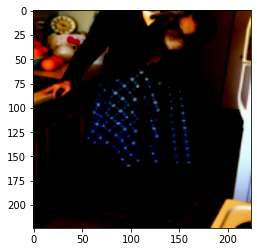

In [ ]:
print(f"Quantidade de amostras no dataset de treino: {len(train_dataset)}")
print(f"Quantidade de amostras no dataset de validação: {len(val_dataset)}")
print("-"*20)
x, y = train_dataset[0]
print(f"Saída da classe CocoDataset: ")
print(f"Imagem = {x} com tamanho de: {x.shape}")
plt.imshow(x.permute(1,2,0))

print("Legendas da imagem: ")
for i in y:
    print(i)

In [ ]:
def collate_custom(batch):
    """
    Args:
        batch: batch of Dataloader
    Returns:
        imgs (Tensor): input images of the batch.
        batch_tokens["input_ids"] (Tensor): tokens of a randomized caption (one sentence tokenized for each image) -- purpose: for training
        texts (List[str]): list containing all five captions of each image -- purpose: calculus of NLP metrics
    """
    
    imgs = [r[0] for r in batch]
    texts = [r[1] for r in batch] 
    text = [random.choice(r[1]) for r in batch] 
    
    batch_tokens = tokenizer.batch_encode_plus(text, return_tensors="pt", padding="longest")

    return (
        torch.stack(imgs), 
        batch_tokens["input_ids"], 
        texts,
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


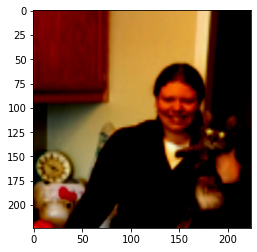

In [ ]:
train_loader_test = DataLoader(train_dataset, batch_size=1, shuffle=False, collate_fn = collate_custom, drop_last=True)

x, y, z  = next(iter(train_loader_test))
plt.imshow(x.squeeze().permute(1,2,0))

In [ ]:
x.shape

torch.Size([1, 3, 224, 224])

In [ ]:
y

tensor([[  71, 2335,   16,    3,    9,  562,   28,    3,    9, 1712,    5,    1]])

In [ ]:
x

tensor([[[[ 0.5529,  0.5277,  0.4743,  ..., -0.2392, -0.2392, -0.2392],
          [ 0.5522,  0.5275,  0.4751,  ..., -0.2367, -0.2364, -0.2362],
          [ 0.5491,  0.5265,  0.4787,  ..., -0.2265, -0.2246, -0.2237],
          ...,
          [ 0.7628,  0.7716,  0.7902,  ..., -0.0646,  0.0033,  0.0354],
          [ 0.8844,  0.8788,  0.8671,  ...,  0.0086,  0.0310,  0.0416],
          [ 0.9137,  0.9047,  0.8856,  ...,  0.0263,  0.0377,  0.0431]],

         [[-0.0118, -0.0316, -0.0736,  ..., -0.3882, -0.3882, -0.3882],
          [-0.0125, -0.0318, -0.0727,  ..., -0.3830, -0.3830, -0.3830],
          [-0.0156, -0.0328, -0.0691,  ..., -0.3612, -0.3612, -0.3612],
          ...,
          [ 0.0058, -0.0032, -0.0224,  ..., -0.2769, -0.2033, -0.1685],
          [ 0.1180,  0.1075,  0.0854,  ..., -0.2015, -0.1749, -0.1623],
          [ 0.1451,  0.1343,  0.1114,  ..., -0.1833, -0.1680, -0.1608]],

         [[-0.5608, -0.5806, -0.6226,  ..., -0.6135, -0.6096, -0.6078],
          [-0.5630, -0.5824, -

In [ ]:
z

[['A woman in a room with a cat.',
  'a woman is holding a cat in her kitchen',
  'A woman is holding a cat in her kitchen.',
  'A girl smiles as she holds a cat and wears a brightly colored skirt.',
  'A woman is working in a kitchen carrying a soft toy.']]

## Complete Dataset (MS-COCO 2014)

In [ ]:
!unzip /content/gdrive/MyDrive/Colab\ Notebooks/Projeto/dataset/annotations_trainval2014.zip

Archive:  /content/gdrive/MyDrive/Colab Notebooks/Projeto/dataset/annotations_trainval2014.zip
  inflating: annotations/instances_train2014.json  
  inflating: annotations/instances_val2014.json  
  inflating: annotations/person_keypoints_train2014.json  
  inflating: annotations/person_keypoints_val2014.json  
  inflating: annotations/captions_train2014.json  
  inflating: annotations/captions_val2014.json  


In [ ]:
!unzip /content/gdrive/MyDrive/Colab\ Notebooks/Projeto/dataset/val2014.zip

A saída de streaming foi truncada nas últimas 5000 linhas.
 extracting: val2014/COCO_val2014_000000535608.jpg  
 extracting: val2014/COCO_val2014_000000279145.jpg  
 extracting: val2014/COCO_val2014_000000243495.jpg  
 extracting: val2014/COCO_val2014_000000225791.jpg  
 extracting: val2014/COCO_val2014_000000428067.jpg  
 extracting: val2014/COCO_val2014_000000059383.jpg  
 extracting: val2014/COCO_val2014_000000558498.jpg  
 extracting: val2014/COCO_val2014_000000376123.jpg  
 extracting: val2014/COCO_val2014_000000191304.jpg  
 extracting: val2014/COCO_val2014_000000171062.jpg  
 extracting: val2014/COCO_val2014_000000014549.jpg  
 extracting: val2014/COCO_val2014_000000121152.jpg  
 extracting: val2014/COCO_val2014_000000276596.jpg  
 extracting: val2014/COCO_val2014_000000029431.jpg  
 extracting: val2014/COCO_val2014_000000036349.jpg  
 extracting: val2014/COCO_val2014_000000502055.jpg  
 extracting: val2014/COCO_val2014_000000438848.jpg  
 extracting: val2014/COCO_val2014_000000

In [ ]:
!unzip /content/gdrive/MyDrive/Colab\ Notebooks/Projeto/dataset/train2014.zip

A saída de streaming foi truncada nas últimas 5000 linhas.
 extracting: train2014/COCO_train2014_000000408557.jpg  
 extracting: train2014/COCO_train2014_000000013714.jpg  
 extracting: train2014/COCO_train2014_000000194043.jpg  
 extracting: train2014/COCO_train2014_000000219859.jpg  
 extracting: train2014/COCO_train2014_000000278135.jpg  
 extracting: train2014/COCO_train2014_000000141015.jpg  
 extracting: train2014/COCO_train2014_000000280923.jpg  
 extracting: train2014/COCO_train2014_000000200024.jpg  
 extracting: train2014/COCO_train2014_000000435713.jpg  
 extracting: train2014/COCO_train2014_000000249993.jpg  
 extracting: train2014/COCO_train2014_000000424160.jpg  
 extracting: train2014/COCO_train2014_000000142761.jpg  
 extracting: train2014/COCO_train2014_000000532668.jpg  
 extracting: train2014/COCO_train2014_000000564904.jpg  
 extracting: train2014/COCO_train2014_000000346384.jpg  
 extracting: train2014/COCO_train2014_000000560934.jpg  
 extracting: train2014/COCO_t

### CocoDataset for complete Dataset


In [ ]:
# Class dataset modified from pytorch <https://pytorch.org/vision/0.12/_modules/torchvision/datasets/coco.html>

class CocoDataset():
    """MS Coco Captions <https://cocodataset.org/#captions-2015> Dataset.

    It requires the COCO API to be installed <https://github.com/pdollar/coco/tree/master/PythonAPI>

    Args:
        root (string): Root directory where images are downloaded to.
        
        annFile (string): Path to json annotation file.

        transform (callable, optional): A function/transform that  takes in an image (PIL image)
        and returns a transformed version. E.g, ``transforms.ToTensor``
        
        idsList: List of image ids to filter. 
        - Example: [35328,
                  559113,
                  495626,
                  169996]

    Output:

        Number of samples: Training dataset: ---- samples/Validation dataset: 40504 samples

        Targets: 5 captions for each image
        - Example:
          ['A plane emitting smoke stream flying over a mountain.',
          'A plane darts across a bright blue sky behind a mountain covered in snow',
          'A plane leaves a contrail above the snowy mountain top.',
          'A mountain that has a plane flying overheard in the distance.',
          'A mountain view with a plume of smoke in the background']
    """

    def __init__(self, root: str, annFile: str, transform: Optional[Callable] = None, idsList:  Optional[Callable] = None):

        self.root = root
        
        self.coco = COCO(annotation_file=annFile)
        self.transform = transform
        self.ids = list(sorted(self.coco.getImgIds()))
        self.ids_captions = list(sorted(self.coco.getAnnIds()))
        
        if idsList is not None:
           self.ids = list(sorted(np.unique(idsList)))
           self.ids = list(map(int, self.ids))

    def _load_image(self, id: int):
        path = self.coco.loadImgs(id)[0]["file_name"]
        data = Image.open(os.path.join(self.root,path)).convert("RGB")
        return data

    def _load_target(self, id: int) -> List[str]:
        return [str(ann["caption"]) for ann in self.coco.loadAnns(self.coco.getAnnIds(id))]

    def __getitem__(self, index: int) -> Tuple[Any, Any]:
        id = self.ids[index]
        image = self._load_image(id)
        target = self._load_target(id)
        
        if self.transform is not None:
            image = self.transform(image.copy())

        return image, target.copy()


    def __len__(self) -> int:
        return len(self.ids)

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained(config_exp["encoder_pretrained_model"])

transform_train = transforms.Compose([
    transforms.ToTensor(),         
    transforms.Resize((feature_extractor.size,feature_extractor.size)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)])

transform_val = transforms.Compose([
    transforms.ToTensor(),         
    transforms.Resize((feature_extractor.size,feature_extractor.size)),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)])


tokenizer = T5Tokenizer.from_pretrained(config_exp["decoder_pretrained_model"])

train_dataset = CocoDataset(root="train2014/",annFile="annotations/captions_train2014.json",transform=transform_train)
eval_dataset = CocoDataset(root="val2014/",annFile="annotations/captions_val2014.json",transform=transform_val)

val_length = int(len(eval_dataset)*0.6)
indices = torch.randperm(len(eval_dataset))

val_dataset = torch.utils.data.Subset(eval_dataset, indices[:val_length])
test_dataset = torch.utils.data.Subset(eval_dataset, indices[val_length:len(eval_dataset)])

Downloading:   0%|          | 0.00/160 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/773k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.17k [00:00<?, ?B/s]

/usr/local/lib/python3.7/dist-packages/transformers/models/t5/tokenization_t5.py:174: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


loading annotations into memory...
Done (t=0.94s)
creating index...
index created!
loading annotations into memory...
Done (t=0.47s)
creating index...
index created!


Number of samples in training dataset: 82783
Number of samples in eval dataset (original validation set): 40504
Number of samples in validation dataset: 24302
Number of samples in test dataset: 16202
--------------------


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Outputs of CocoDataset: 
Image = tensor([[[-0.9779, -0.9931, -0.9955,  ...,  0.1102,  0.0539,  0.0435],
         [-0.9934, -0.9928, -0.9943,  ...,  0.1483,  0.0848,  0.0652],
         [-0.9989, -1.0000, -0.9930,  ...,  0.0940,  0.0802,  0.0763],
         ...,
         [-0.9523, -0.8918, -0.8603,  ..., -0.4475, -0.4322, -0.8135],
         [-0.9606, -0.9256, -0.8737,  ..., -0.7670, -0.9331, -0.9693],
         [-0.9622, -0.9411, -0.9064,  ..., -0.9770, -0.9618, -0.9721]],

        [[-0.8144, -0.8275, -0.8207,  ...,  0.3930,  0.3441,  0.3337],
         [-0.8422, -0.8357, -0.8199,  ...,  0.4267,  0.3734,  0.3554],
         [-0.8207, -0.8139, -0.7962,  ...,  0.3869,  0.3939,  0.3900],
         ...,
         [-0.9939, -0.9474, -0.8859,  ..., -0.2250, -0.1579, -0.6711],
         [-0.9898, -0.9767, -0.9114,  ..., -0.6295, -0.7844, -0.9344],
         [-1.0000, -0.9789, -0.9613,  ..., -0.9166, -0.9549, -0.9781]],

        [[-0.1317, -0.1258, -0.1035,  ...,  0.5969,  0.5480,  0.5391],
         [-0

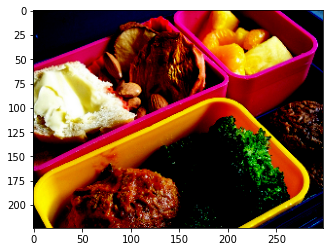

In [ ]:
print(f"Number of samples in training dataset: {len(train_dataset)}")
print(f"Number of samples in eval dataset (original validation set): {len(eval_dataset)}")
print(f"Number of samples in validation dataset: {len(val_dataset)}")
print(f"Number of samples in test dataset: {len(test_dataset)}")
print("-"*20)
x, y = train_dataset[0]
print(f"Outputs of CocoDataset: ")
print(f"Image = {x} with a shape of: {x.shape}")
plt.imshow(x.permute(1,2,0))

print("Image captions: ")
for i in y:
    print(i)

In [ ]:
# Function to replace double quotes ("") to single ('') in the captions
# reference from: <https://stackoverflow.com/questions/42183479/i-want-to-replace-single-quotes-with-double-quotes-in-a-list>

class str2(str): 
    def __repr__(self):
        # Allow str.__repr__() to do the hard work, then
        # remove the outer two characters, double quotes,
        # and replace them with single quotes.
        return "".join(("'", super().__repr__()[1:-1], "'"))

In [ ]:
def collate_custom(batch):
    """
    Args:
        batch: batch of Dataloader
    Returns:
        imgs (Tensor): input images of the batch.
        batch_tokens["input_ids"] (Tensor): tokens of a randomized caption (one sentence tokenized for each image) -- purpose: for training
        texts (List[str]): list containing all five captions of each image -- purpose: calculus of NLP metrics
    """
    imgs = [r[0] for r in batch]
    texts = [random.sample(list(map(str, r[1])), k=5) for r in batch]  
    # Need to use random.sample() bacause some samples contain more than 5 captions per image 
    text = [random.choice(r[1]) for r in batch]
    
    batch_tokens = tokenizer.batch_encode_plus(text, return_tensors="pt", padding="longest")

    return (
        torch.stack(imgs), 
        batch_tokens["input_ids"], 
        texts,
    )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


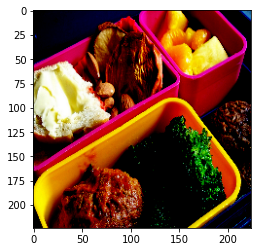

In [ ]:
train_loader_test = DataLoader(train_dataset, batch_size=14, shuffle=False, collate_fn = collate_custom, drop_last=True)

x, y, z  = next(iter(train_loader_test))
plt.imshow(x[0].squeeze().permute(1,2,0))

In [ ]:
train = iter(train_loader_test)

In [ ]:
x, y, z  = next(train)
z

[['Food in a bowl with carrots and drinks around it',
  'Asian noodles, cut up egg roll with greens and carrots in a white bowl.',
  'A plate of food: meat, noodles, sprouts, carrots and salad',
  'Healthy foods being used to create a dinner dish.',
  'A bowl of pasta, carrots, egg roll and cabbage.'],
 ['An old train drives on the tracks under a bridge. ',
  'The passenger train has stopped at a station.',
  'A trailer is sitting under a bridge and some power lines.',
  'A white and orange train passing by trees and a lamppost.',
  'A lone train sits on the train track under the bridge.'],
 ['A group of kids playing soccer on a field.',
  'A young man kicking a soccer ball around a field.',
  'A young boy playing soccer on a grassy field',
  'Small child in soccer uniform kicking at yellow ball. ',
  'There are several young boys practicing soccer, some with their dads.'],
 ['a small kid holds on to some vegetables ',
  'The young child is happily holding a fresh vegetable. ',
  'A li

In [ ]:
x.shape

torch.Size([1, 3, 224, 224])

In [ ]:
y

tensor([[19188,  4371,   271,   261,    12,   482,     3,     9,  2634,  4419,
             5,     1,     0,     0,     0,     0,     0,     0],
        [   71,     3,    40,   782,  2412,  2561,     7,    30,     8,  2412,
          1463,   365,     8,  4716,     5,     1,     0,     0],
        [   71,  1021,   388,     3, 24820,     3,     9, 10749,  1996,   300,
             3,     9,  1057,     5,     1,     0,     0,     0],
        [   71,   385,  3202,  4532,     3,     9,   609,   423,    13,    62,
            17, 24630,     5,     1,     0,     0,     0,     0],
        [   71,   388,  7494,  5210,     7,   323,     3,     9,  2983,  2303,
         13150,     5,     1,     0,     0,     0,     0,     0],
        [   71,   840,   562,    28,     3,     9,  6452,     6,  1975,   953,
            11,   192,  3196,     5,     1,     0,     0,     0],
        [   37,   388,  3993,     7,  5119,     3,     9,  1442,  5378,  6177,
          1084,     3,     9,  4374,    13,   151, 

In [ ]:
x

tensor([[[[-8.9633e-01, -9.1719e-01, -9.5332e-01,  ...,  1.5517e-01,
            1.6685e-01,  1.5636e-01],
          [-9.0391e-01, -9.4364e-01, -9.3969e-01,  ...,  1.6580e-01,
            1.8553e-01,  1.7624e-01],
          [-9.2565e-01, -9.3103e-01, -9.4580e-01,  ..., -4.9548e-02,
            1.0955e-01,  1.6477e-01],
          ...,
          [ 3.8296e-01,  5.1789e-01,  3.1707e-01,  ..., -5.2308e-01,
           -5.7754e-01, -5.7986e-01],
          [ 4.2887e-01,  3.9349e-01,  4.3516e-01,  ..., -5.7759e-01,
           -5.6576e-01, -5.5244e-01],
          [ 3.5468e-01,  4.3196e-01,  4.2441e-01,  ..., -5.7231e-01,
           -7.9382e-01, -8.7565e-01]],

         [[-6.2780e-01, -6.5053e-01, -6.6961e-01,  ...,  4.5627e-01,
            4.5705e-01,  4.4656e-01],
          [-6.3303e-01, -6.5873e-01, -6.5478e-01,  ...,  4.8120e-01,
            4.7006e-01,  4.7503e-01],
          [-6.5039e-01, -6.4487e-01, -6.6345e-01,  ...,  4.6449e-01,
            4.9169e-01,  4.6892e-01],
          ...,
     

In [ ]:
z

[['Closeup of bins of food that include broccoli and bread.',
  'A meal is presented in brightly colored plastic trays.',
  'there are containers filled with different kinds of foods',
  'Colorful dishes holding meat, vegetables, fruit, and bread.',
  'A bunch of trays that have different food.'],
 ['A giraffe eating food from the top of the tree.',
  'A giraffe standing up nearby a tree ',
  'A giraffe mother with its baby in the forest.',
  'Two giraffes standing in a tree filled area.',
  'A giraffe standing next to a forest filled with trees.'],
 ['A flower vase is sitting on a porch stand.',
  'White vase with different colored flowers sitting inside of it. ',
  'a white vase with many flowers on a stage',
  'A white vase filled with different colored flowers.',
  'A vase with red and white flowers outside on a sunny day.'],
 ['A zebra grazing on lush green grass in a field.',
  'Zebra reaching its head down to ground where grass is. ',
  'The zebra is eating grass in the sun.',
 

## Function to unormalize image (only for displaying results)

In [ ]:
# Function to unnormalize image only for displaying image without the normalization applied by transforms. 
# reference: <https://stackoverflow.com/questions/61368632/display-image-in-a-pil-format-from-torch-tensor>

class UnNormalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor

unorm = UnNormalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)

# Metrics


In [ ]:
meteor = datasets.load_metric('meteor')
bleu = datasets.load_metric('sacrebleu')

def calculate_metrics(preds, refs, metrics="all"):
    if metrics=="all":
        bleu_score = bleu.compute(predictions=preds, references=refs)

        Meteor_mean = 0
        # Meteor score (average of scores in the batch)
        for i in range(len(preds)):
            # Choosing the maximum score for more than one reference
            meteor_score = [meteor.compute(predictions=[preds[i]], references = [s])['meteor'] for s in refs[i]] 
            Meteor_mean+=max(meteor_score)

            # Averaging results with more than one reference
            #meteor_score = meteor.compute(predictions=[preds[i]]*5, references=refs[i])
            #Meteor_mean+=meteor_score['meteor']
        
        Meteor_mean = Meteor_mean/len(preds)

        return bleu_score["score"], bleu_score["precisions"], Meteor_mean*100.

    if metrics=="bleu":
        bleu_score = bleu.compute(predictions=preds, references=refs)
        
        return bleu_score["score"], bleu_score["precisions"]

    if metrics=="meteor":
        Meteor_mean = 0
        # Meteor
        for i in range(len(preds)):
            # Choosing the maximum score for more than one reference
            meteor_score = [meteor.compute(predictions=[preds[i]], references = [s])['meteor'] for s in z[i]] 
            Meteor_mean+=max(meteor_score)

            # Averaging results with more than one reference
            #meteor_score = meteor.compute(predictions=[preds[i]]*5, references=refs[i])
            #Meteor_mean+=meteor_score['meteor']
        
        Meteor_mean = Meteor_mean/len(preds)

        return  Meteor_mean*100.

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


## Examples

In [ ]:
train_loader_test = DataLoader(train_dataset, batch_size=3, shuffle=False, collate_fn = collate_custom, drop_last=True)

x, y, z  = next(iter(train_loader_test))

In [ ]:
z

[['Closeup of bins of food that include broccoli and bread.',
  'A meal is presented in brightly colored plastic trays.',
  'there are containers filled with different kinds of foods',
  'Colorful dishes holding meat, vegetables, fruit, and bread.',
  'A bunch of trays that have different food.'],
 ['A giraffe eating food from the top of the tree.',
  'A giraffe standing up nearby a tree ',
  'A giraffe mother with its baby in the forest.',
  'Two giraffes standing in a tree filled area.',
  'A giraffe standing next to a forest filled with trees.'],
 ['A flower vase is sitting on a porch stand.',
  'White vase with different colored flowers sitting inside of it. ',
  'a white vase with many flowers on a stage',
  'A white vase filled with different colored flowers.',
  'A vase with red and white flowers outside on a sunny day.']]

In [ ]:
predictions = ['Closeup of bins of food that include broccoli and bread.',
 'A giraffe eating food from the top of the tree.',
 'A cat']

predictions

['Closeup of bins of food that include broccoli and bread.',
 'A giraffe eating food from the top of the tree.',
 'A cat']

In [ ]:
calculate_metrics(predictions, z)

(73.01508580595927,
 [95.83333333333333, 95.23809523809524, 100.0, 100.0],
 0.2635835986584488)

In [ ]:
pred2 = ['A woman riding a pink bike.',
 'A group of people around a tree.',
 'A large boat filled with water.']

In [ ]:
calculate_metrics(pred2, z)

(7.241426204102065,
 [50.0, 15.789473684210526, 3.125, 1.9230769230769231],
 0.1624767377987361)

In [ ]:
len(train_all_targets)

20

In [ ]:
len(preds_sentences)

20

In [ ]:
preds_sentences[0]

'of images   are'

In [ ]:
train_all_targets

[['A group of baseball players playing a game of ball.',
  'A professional baseball player swinging at a ball.',
  'a guy getting ready to hit the ball and the catcher ready to catch',
  'A baseball player attempts to hit a baseball.',
  'One man is swinging a bat and running while a man holds his hand out behind him to catch the ball. '],
 ['A woman swings a racket inside of a tennis machine.',
  'A young tennis player is finishing his swing.',
  'A girl swinging a tennis racquet in a ball cage.',
  'A woman swings a tennis racquet at a US Open display. ',
  'A person playing a tennis game in front of spectators. '],
 ['Two men walking on the beach with their surfboards',
  'Two guys walking on the beach carrying their surf boards.',
  'Two men are walking away from the water on a beach and are carrying surfboards.',
  'Surfers coming up from the beach in surfing attire. ',
  'Two men standing on a sandy beach holding surfboards.'],
 ['many large pots and vases outside a a shops windo

In [ ]:
list(map(str2,preds_sentences))

['of the players in thea sport in theaor     Sport',
 'mant willign  s is',
 'have out the    ss m    Un',
 'people areass of habitsa are ofa fewbowel..s',
 'following main who   to answer  angles in the the  the the',
 'gu- of  tresars,  of a,s',
 'Mi s can  on thea!4.      Mi',
 '- stocks are -ss and- and the of a  wall carpetside. The',
 'ofsaas,  ,',
 'the  ma. the. I',
 'risto and, ad of  s a bed  A',
 'A. can     in a computer and  in',
 '.. thea   rum.hes the line  thea pondant.',
 'pro’ thea r, thea to. the. the s park. the',
 'a severe     s. Vtic',
 'la  the' zi  ,  a  et,.',
 'un   the  to   the as',
 'uß withwhose bridemusd of her and for hera divorce.s',
 'Cette  family who in me  the.aau.g',
 '--  the   of Thea']

# Model: Encoder (ViT) e Decoder (T5)

In [ ]:
class MyEncoder(nn.Module):
    def __init__(self, pretrained_model):
        """
        Implements the Encoder."

        Args:
            pretrained_model (str): name of the pretrained model

        """

        super(MyEncoder, self).__init__()

        self.encoder = ViTModel.from_pretrained(pretrained_model)

    def forward(self, input):
        out  = self.encoder(pixel_values = input)

        return out

In [ ]:
class MyDecoder(nn.Module):
    def __init__(self, pretrained_model, encoder_modeldim):
        """
        Implements the Encoder."

        Args:
            pretrained_model (str): name of the pretrained model

        """
        
        super(MyDecoder, self).__init__()
        
        self.decoder = T5ForConditionalGeneration.from_pretrained(pretrained_model)
        self.linear = nn.Linear(self.decoder.model_dim, encoder_modeldim, bias = False)
        self.encoder_modeldim = encoder_modeldim

    def forward(self, output_encoder, targets, decoder_ids=None):

        if self.decoder.model_dim!=self.encoder_modeldim:
            print(f"Changed model hidden dimension from {self.encoder_modeldim} to {self.decoder.model_dim}")
            output_encoder = self.linear(output_encoder)
            print(output_encoder.shape)

        # Validation/Testing
        if decoder_ids is not None:
            out = self.decoder(encoder_outputs=output_encoder, decoder_input_ids=decoder_ids)

        # Training
        else:
            out = self.decoder(encoder_outputs=output_encoder, labels=targets)

        return out

In [ ]:
class EncoderDecoder(nn.Module):
    def __init__(self, pretrained_model: Tuple[str], encoder_dmodel=768, eos_token_id=None, pad_token_id=None):
        """
        Implements a model that combines MyEncoder and MyDecoder."

        Args:
            pretrained_model (tuple): name of the pretrained model
            encoder_dmodel (int):  hidden dimension of the encoder output
            eos_token_id (torch.long): token used for end of sentence  
            pad_token_id (torch.long): token used for padding

        """
        
        super(EncoderDecoder, self).__init__()
        self.eos_token_id = eos_token_id
        self.pad_token_id = pad_token_id
        self.encoder = MyEncoder(pretrained_model[0])
        self.encoder_dmodel = encoder_dmodel

        # Freeze parameters from encoder
        #for p in self.encoder.parameters():
        #    p.requires_grad=False

        self.decoder = MyDecoder(pretrained_model[1], self.encoder_dmodel)
        self.decoder_start_token_id = self.decoder.decoder.config.decoder_start_token_id

    def forward(self, images = None, targets = None, decoder_ids = None):
        output_encoder  = self.encoder(images)
        out = self.decoder(output_encoder, targets, decoder_ids)

        return out

In [ ]:
model = EncoderDecoder(pretrained_model = (config_exp["encoder_pretrained_model"], config_exp["decoder_pretrained_model"]), 
                       eos_token_id=tokenizer.eos_token_id, 
                       pad_token_id=tokenizer.pad_token_id)

Downloading:   0%|          | 0.00/502 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/330M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/850M [00:00<?, ?B/s]

In [ ]:
num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f'Número de parâmetros do modelo: {num_params}')

Número de parâmetros do modelo: 309882624


# Training

## Training (part 1)

  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

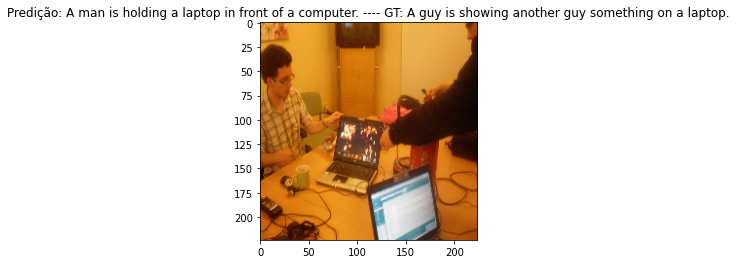

Época: 0/49 Train Loss: 2.679004 Valid Loss: 2.263026/ Train BLEU: 6.732508688087945 Valid BLEU: 17.327023000493238/ Valid METEOR: 0.2560162402872098


wandb: WARNING Calling wandb.run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 1/49 Train Loss: 2.498396 Valid Loss: 2.206323/ Train BLEU: 10.108126680949848


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 2/49 Train Loss: 2.406695 Valid Loss: 2.167892/ Train BLEU: 11.50224288702805


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 3/49 Train Loss: 2.345903 Valid Loss: 2.138698/ Train BLEU: 12.27308141651389


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 4/49 Train Loss: 2.300295 Valid Loss: 2.115295/ Train BLEU: 12.84218714610016


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

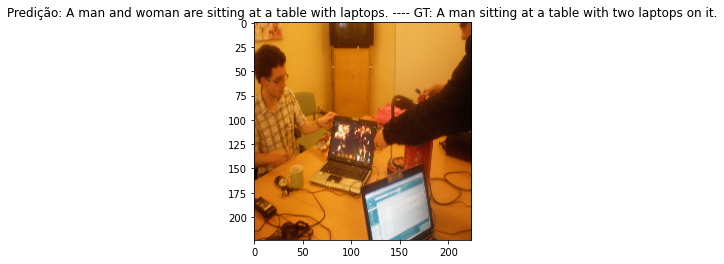

Época: 5/49 Train Loss: 2.263249 Valid Loss: 2.095248/ Train BLEU: 13.420484759429376 Valid BLEU: 24.623032243867822/ Valid METEOR: 0.30435000227878445


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 6/49 Train Loss: 2.232104 Valid Loss: 2.077831/ Train BLEU: 13.715603718594757


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 7/49 Train Loss: 2.205348 Valid Loss: 2.061998/ Train BLEU: 14.051293147814512


  0%|          | 0/2759 [00:00<?, ?it/s]

  0%|          | 0/810 [00:00<?, ?it/s]

Época: 8/49 Train Loss: 2.181743 Valid Loss: 2.048790/ Train BLEU: 14.334690920225057


  0%|          | 0/2759 [00:00<?, ?it/s]

KeyboardInterrupt: ignored

In [ ]:
# Treinamento
compare=float('inf')

model = EncoderDecoder(pretrained_model = (config_exp["encoder_pretrained_model"], config_exp["decoder_pretrained_model"]), 
                       eos_token_id=tokenizer.eos_token_id, 
                       pad_token_id=tokenizer.pad_token_id)

model = model.to(device)

# DataLoader
train_loader = DataLoader(train_dataset, batch_size=config_exp["batch_size"], shuffle=True, collate_fn = collate_custom, drop_last=True,  num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=config_exp["batch_size"], collate_fn = collate_custom, drop_last=True, num_workers=4, pin_memory=True)

# Optmizer
optimizer = torch.optim.Adam(model.parameters(), lr=config_exp["learning_rate"])

# Initializing Lists
train_losses = []
val_losses = []


# Starting wandb
if run_id is not None:
    print(run_id)
    run = wandb.init(project="Image_Captioning", name=f"experiment_{run}", config=config_exp, resume=run_id, id=run_id, settings=wandb.Settings(start_method="thread"), reinit=True, dir=os.getenv("WANDB_DIR", config_exp["path_save_checkpoints"]))
    
    if wandb.run.resumed:
        print("Wandb --resumed")
        wandb.restore(config_exp["path_save_checkpoints"]+config_exp["checkpoint_folder_name"])
        checkpoint = torch.load(config_exp["path_save_checkpoints"]+config_exp["checkpoint_folder_name"])
        model.load_state_dict(checkpoint['model_state_dict'])
        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
        epoch_init = checkpoint['epoch']+1
        loss = checkpoint['loss']
else:
    epoch_init = 0
    run = wandb.init(project="Image_Captioning", name=f"experiment_{run}", config=config_exp, resume=True, settings=wandb.Settings(start_method="thread"), reinit=True, dir=os.getenv("WANDB_DIR", config_exp["path_save_checkpoints"]))
    

for epoch in range(epoch_init, config_exp["epochs"]):

    # Training Loop
    bleu_list, bleu_list1, bleu_list2, bleu_list3, bleu_list4  = [], [], [], [], []

    for batch, (train_inputs, train_targets, train_all_targets) in enumerate(tqdm(train_loader)):
        model.train()
        model.zero_grad()

        train_inputs = train_inputs.to(device)
        train_targets = train_targets.to(device)

        # Applying mask of value -100  for all tokens =  [PAD]
        mylabels = train_targets.clone()
        mylabels[mylabels==tokenizer.pad_token_id] = -100

        train_output = model(images = train_inputs, targets=mylabels)
        logits = train_output.logits
        loss = train_output.loss
        
        train_preds = torch.argmax(logits, dim=-1)

        loss.backward()
        optimizer.step()

        train_losses.append(loss.item())
        preds_sentences = tokenizer.batch_decode(train_preds,  skip_special_tokens=True) #returns a list
        preds_sentences = list(map(str2,preds_sentences))
        bleu_score, bleu_precisions = calculate_metrics(preds_sentences, train_all_targets, metrics="bleu")
        
        bleu_list.append(bleu_score)
        bleu_list1.append(bleu_precisions[0])
        bleu_list2.append(bleu_precisions[1])
        bleu_list3.append(bleu_precisions[2])
        bleu_list4.append(bleu_precisions[3])

        wandb.log({"train/batch": batch,
                   "train/batch/loss":loss.item(), 
                   "train/batch/bleu_score":bleu_score, 
                   "train/batch/bleu_score_p1":bleu_precisions[0],
                   "train/batch/bleu_score_p2":bleu_precisions[1],
                   "train/batch/bleu_score_p3":bleu_precisions[2],
                   "train/batch/bleu_score_p4":bleu_precisions[3]})
        
    train_loss = sum(train_losses)/len(train_losses)
    train_bleu = sum(bleu_list)/len(bleu_list)
    train_bleu1 = sum(bleu_list1)/len(bleu_list1)
    train_bleu2 = sum(bleu_list2)/len(bleu_list2)
    train_bleu3 = sum(bleu_list3)/len(bleu_list3)
    train_bleu4 = sum(bleu_list4)/len(bleu_list4)

    # Validation Loop
    with torch.no_grad():
        bleu_list, bleu_list1, bleu_list2, bleu_list3, bleu_list4, meteor_list  = [], [], [], [], [], []
        bleu_score = None
        for val_batch, (val_inputs, val_targets, val_all_targets) in enumerate(tqdm(val_loader)):
            val_inputs = val_inputs.to(device)
            val_targets = val_targets.to(device)
            model.eval()
    
            decoded_ids = torch.full((val_inputs.shape[0], 1),
                            model.decoder_start_token_id,
                            dtype=torch.long).to(val_inputs.device)
            

            # Aplicando inferência do modelo (por teacher forcing) para obter a loss da validação
            labels_val = val_targets.clone()
            labels_val[labels_val==tokenizer.pad_token_id] = -100
            val_output = model(images = val_inputs, targets=labels_val)
            val_losses.append(val_output.loss.item())

            wandb.log({"val/batch": val_batch, 
                    "val/batch/loss": val_output.loss.item()})
            
            if epoch % config_exp["eval_epochs"] == 0:
                for step in range(config_exp["max_seq_length"]):
                    output_val =  model(images =  val_inputs, decoder_ids= decoded_ids)
                    
                    val_logits = output_val.logits
                    next_token_logits = val_logits[:, -1, :]
                    next_token_id = next_token_logits.argmax(1).unsqueeze(-1)
                    decoded_ids = torch.cat([decoded_ids, next_token_id], dim=-1)

                    # Check if reached end of senquence for all sentences in the batch
                    if torch.eq(next_token_id[:, -1], model.eos_token_id).all():
                        break


                val_preds_sentences = tokenizer.batch_decode(decoded_ids,  skip_special_tokens=True)
                val_preds_sentences = list(map(str2,val_preds_sentences))
                bleu_score, bleu_precisions, meteor_score = calculate_metrics(val_preds_sentences, val_all_targets)
        
                bleu_list.append(bleu_score)
                bleu_list1.append(bleu_precisions[0])
                bleu_list2.append(bleu_precisions[1])
                bleu_list3.append(bleu_precisions[2])
                bleu_list4.append(bleu_precisions[3])
                meteor_list.append(meteor_score)

                wandb.log({"val/batch/bleu_score":bleu_score, 
                        "val/batch/bleu_score_p1":bleu_precisions[0],
                        "val/batch/bleu_score_p2":bleu_precisions[1],
                        "val/batch/bleu_score_p3":bleu_precisions[2],
                        "val/batch/bleu_score_p4":bleu_precisions[3], 
                        "val/batch/meteor_score": meteor_score})

    val_loss = sum(val_losses)/len(val_losses)

    wandb.log({"epoch": epoch, 
            "train/epoch/loss": train_loss,
            "train/epoch/bleu_score": train_bleu,
            "train/epoch/bleu_score1": train_bleu1,
            "train/epoch/bleu_score2": train_bleu2,
            "train/epoch/bleu_score3": train_bleu3,
            "train/epoch/bleu_score4": train_bleu4,
            "val/epoch/loss": val_loss})   
    
    if val_loss<compare:
        compare=val_loss
        torch.save(model, config_exp["path_save_model"])

    if epoch % config_exp["eval_epochs"] == 0:
        val_bleu = sum(bleu_list)/len(bleu_list)
        val_bleu1 = sum(bleu_list1)/len(bleu_list1)
        val_bleu2 = sum(bleu_list2)/len(bleu_list2)
        val_bleu3 = sum(bleu_list3)/len(bleu_list3)
        val_bleu4 = sum(bleu_list4)/len(bleu_list4)
        val_meteor = sum(meteor_list)/len(meteor_list)

        plt.figure()
        plt.imshow(unorm(val_inputs[-1].cpu()).permute(1,2,0))
        plt.title("Predição: "+str(val_preds_sentences[-1] + " ---- GT: " +str(val_all_targets[-1][0])))
        plt.show()
        plt.pause(0.05)
        print(f'Época: {epoch:d}/{config_exp["epochs"] - 1:d} Train Loss: {train_loss:.6f} Valid Loss: {val_loss:.6f}/ Train BLEU: {train_bleu} Valid BLEU: {val_bleu}/ Valid METEOR: {val_meteor}')

        wandb.log({"val/epoch/bleu_score": val_bleu,
                   "val/epoch/bleu_score1": val_bleu1,
                   "val/epoch/bleu_score2": val_bleu2,
                   "val/epoch/bleu_score3": val_bleu3,
                   "val/epoch/bleu_score4": val_bleu4,
                   "val/epoch/meteor_score": val_meteor})

    else:        
        print(f'Época: {epoch:d}/{config_exp["epochs"] - 1:d} Train Loss: {train_loss:.6f} Valid Loss: {val_loss:.6f}/ Train BLEU: {train_bleu}')

    # Saving Checkpoint
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss,
        }, config_exp["path_save_checkpoints"]+config_exp["checkpoint_folder_name"])
    wandb.save()


# Evaluation on Test dataset

In [ ]:
model = torch.load(config_exp["path_save_model"])

run_id = '9q82bswx'

if run_id is None:
    raise Exception("Define run_id to continue saving logs in the same experiment.")

In [ ]:
run = wandb.init(project="Image_Captioning", name=f"experiment_{run}", config=config_exp, resume=run_id, id=run_id, settings=wandb.Settings(start_method="thread"), reinit=True, dir=os.getenv("WANDB_DIR", config_exp["path_save_checkpoints"]))

test_loader = DataLoader(test_dataset, batch_size=20, collate_fn = collate_custom)
columns = ["id", "image", "predicted", "captions (GT)", "BLEU", "BLEU-1","BLEU-2", "BLEU-3", "BLEU-4", "METEOR"]
mytable = wandb.Table(columns=columns)
bleu_list, bleu_list1, bleu_list2, bleu_list3, bleu_list4, meteor_list  = [], [], [], [], [], []

with torch.no_grad():
    for idx, (inputs, targets, all_targets) in enumerate(tqdm(test_loader)):
        model.eval()
        inputs = inputs.to(device)
        decoded_ids = torch.full((inputs.shape[0], 1),
                            model.decoder_start_token_id,
                            dtype=torch.long).to(inputs.device)
            
        for step in range(32):
            output_val =  model(images =  inputs, decoder_ids= decoded_ids)
                
            #print(f"logits.shape: {output_val.logits.shape}")
            val_logits = output_val.logits
            next_token_logits = val_logits[:, -1, :]
            next_token_id = next_token_logits.argmax(1).unsqueeze(-1)
            decoded_ids = torch.cat([decoded_ids, next_token_id], dim=-1)
            #print(f"decoded_ids batch: {decoded_ids}")

            # Check if output is end of senquence for all batches
            if torch.eq(next_token_id[:, -1], model.eos_token_id).all():
                break

        
        eval_preds_sentences = tokenizer.batch_decode(decoded_ids,  skip_special_tokens=True)
        bleu_score, bleu_precisions, meteor_score = calculate_metrics(eval_preds_sentences, all_targets)

        bleu_list.append(bleu_score)
        bleu_list1.append(bleu_precisions[0])
        bleu_list2.append(bleu_precisions[1])
        bleu_list3.append(bleu_precisions[2])
        bleu_list4.append(bleu_precisions[3])
        meteor_list.append(meteor_score)

        mytable.add_data(idx, wandb.Image(unorm(inputs[0].squeeze().cpu()).permute(1,2,0).numpy()), eval_preds_sentences[0], list(all_targets[0]),bleu_score, bleu_precisions[0], bleu_precisions[1], bleu_precisions[2], bleu_precisions[3], meteor_score)

       
wandb.log({f"Table_test_dataset_samples01": mytable})

test_bleu = sum(bleu_list)/len(bleu_list)
test_bleu1 = sum(bleu_list1)/len(bleu_list1)
test_bleu2 = sum(bleu_list2)/len(bleu_list2)
test_bleu3 = sum(bleu_list3)/len(bleu_list3)
test_bleu4 = sum(bleu_list4)/len(bleu_list4)
test_meteor = sum(meteor_list)/len(meteor_list)

print(f"Test - BLEU: {test_bleu}/ BLEU-1: {test_bleu1}/ BLEU-2: {test_bleu2}/ BLEU-3: {test_bleu3}/ BLEU-4: {test_bleu4}/ METEOR: {test_meteor}")

epoch,8
train/batch,238
train/batch/bleu_score,17.76108
train/batch/bleu_score_p1,61.45833
train/batch/bleu_score_p2,29.66102
train/batch/bleu_score_p3,12.34568
train/batch/bleu_score_p4,4.42177
train/batch/loss,1.74627
train/epoch/bleu_score,14.33469
train/epoch/bleu_score1,54.23646
train/epoch/bleu_score2,23.99743


  0%|          | 0/811 [00:00<?, ?it/s]

Test - BLEU: 25.180801537911474/ BLEU-1: 72.2502089783455/ BLEU-2: 36.79226597202286/ BLEU-3: 17.92656796146456/ BLEU-4: 8.83690394981644/ METEOR: 48.768373036843364


In [ ]:
wandb.log({f"Table_test_dataset": mytable})

In [ ]:
wandb.finish()

epoch,8
train/batch,238
train/batch/bleu_score,17.76108
train/batch/bleu_score_p1,61.45833
train/batch/bleu_score_p2,29.66102
train/batch/bleu_score_p3,12.34568
train/batch/bleu_score_p4,4.42177
train/batch/loss,1.74627
train/epoch/bleu_score,14.33469
train/epoch/bleu_score1,54.23646
train/epoch/bleu_score2,23.99743


# Testing Metrics in Test Dataset

In [ ]:
meteor = datasets.load_metric('meteor')
bleu = datasets.load_metric('sacrebleu')

def calculate_metrics(preds, refs, metrics="all"):
    if metrics=="all":
        bleu_score = bleu.compute(predictions=preds, references=refs)

        Meteor_max = 0
        Meteor_mean = 0
        # Meteor score (average of scores in the batch)
        for i in range(len(preds)):
            # Choosing the maximum score for more than one reference
            meteor_score = [meteor.compute(predictions=[preds[i]], references = [s])['meteor'] for s in refs[i]] 
            Meteor_max+=max(meteor_score)

            # Averaging results with more than one reference
            meteor_score = meteor.compute(predictions=[preds[i]]*5, references=refs[i])
            Meteor_mean+=meteor_score['meteor']
        
        Meteor_mean = Meteor_mean/len(preds)
        Meteor_max = Meteor_max/len(preds)

        return bleu_score, Meteor_mean*100., Meteor_max*100.

    if metrics=="bleu":
        bleu_score = bleu.compute(predictions=preds, references=refs)
        
        return bleu_score

    if metrics=="meteor":
        Meteor_max = 0
        Meteor_mean = 0
        # Meteor score (average of scores in the batch)
        for i in range(len(preds)):
            # Choosing the maximum score for more than one reference
            meteor_score = [meteor.compute(predictions=[preds[i]], references = [s])['meteor'] for s in refs[i]] 
            Meteor_max+=max(meteor_score)

            # Averaging results with more than one reference
            meteor_score = meteor.compute(predictions=[preds[i]]*5, references=refs[i])
            Meteor_mean+=meteor_score['meteor']
        
        Meteor_mean = Meteor_mean/len(preds)
        Meteor_max = Meteor_max/len(preds)

        return Meteor_mean*100., Meteor_max*100.

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
# Class dataset modified from pytorch <https://pytorch.org/vision/0.12/_modules/torchvision/datasets/coco.html>

class CocoDataset():
    """MS Coco Captions <https://cocodataset.org/#captions-2015> Dataset.

    It requires the COCO API to be installed <https://github.com/pdollar/coco/tree/master/PythonAPI>

    Args:
        root (string): Root directory where images are downloaded to.
        
        annFile (string): Path to json annotation file.

        transform (callable, optional): A function/transform that  takes in an image (PIL image)
        and returns a transformed version. E.g, ``transforms.ToTensor``
        
        idsList: List of image ids to filter. 
        - Example: [35328,
                  559113,
                  495626,
                  169996]

    Output:

        Number of samples: Training dataset: ---- samples/Validation dataset: 40504 samples

        Targets: 5 captions for each image
        - Example:
          ['A plane emitting smoke stream flying over a mountain.',
          'A plane darts across a bright blue sky behind a mountain covered in snow',
          'A plane leaves a contrail above the snowy mountain top.',
          'A mountain that has a plane flying overheard in the distance.',
          'A mountain view with a plume of smoke in the background']
    """

    def __init__(self, root: str, annFile: str, transform: Optional[Callable] = None, idsList:  Optional[Callable] = None):

        self.root = root
        
        self.coco = COCO(annotation_file=annFile)
        self.transform = transform
        self.ids = list(sorted(self.coco.getImgIds()))
        self.ids_captions = list(sorted(self.coco.getAnnIds()))
        
        if idsList is not None:
           self.ids = list(sorted(np.unique(idsList)))
           self.ids = list(map(int, self.ids))

    def _load_image(self, id: int):
        path = self.coco.loadImgs(id)[0]["file_name"]
        data = Image.open(os.path.join(self.root,path)).convert("RGB")
        return data

    def _load_target(self, id: int) -> List[str]:
        return [str(ann["caption"]) for ann in self.coco.loadAnns(self.coco.getAnnIds(id))]

    def __getitem__(self, index: int) -> Tuple[Any, Any]:
        id = self.ids[index]
        image = self._load_image(id)
        target = self._load_target(id)
        
        if self.transform is not None:
            image = self.transform(image.copy())

        return image, target.copy(), id


    def __len__(self) -> int:
        return len(self.ids)

In [ ]:
feature_extractor = ViTFeatureExtractor.from_pretrained(config_exp["encoder_pretrained_model"])

transform_train = transforms.Compose([
    transforms.ToTensor(),         
    transforms.Resize((feature_extractor.size,feature_extractor.size)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)])

transform_val = transforms.Compose([
    transforms.ToTensor(),         
    transforms.Resize((feature_extractor.size,feature_extractor.size)),
    transforms.Normalize(mean=feature_extractor.image_mean, std=feature_extractor.image_std)])


tokenizer = T5Tokenizer.from_pretrained(config_exp["decoder_pretrained_model"])

train_dataset = CocoDataset(root="train2014/",annFile="annotations/captions_train2014.json",transform=transform_train)
eval_dataset = CocoDataset(root="val2014/",annFile="annotations/captions_val2014.json",transform=transform_val)

val_length = int(len(eval_dataset)*0.6)
indices = torch.randperm(len(eval_dataset))

val_dataset = torch.utils.data.Subset(eval_dataset, indices[:val_length])
test_dataset = torch.utils.data.Subset(eval_dataset, indices[val_length:len(eval_dataset)])

/usr/local/lib/python3.7/dist-packages/transformers/models/t5/tokenization_t5.py:174: FutureWarning: This tokenizer was incorrectly instantiated with a model max length of 512 which will be corrected in Transformers v5.
For now, this behavior is kept to avoid breaking backwards compatibility when padding/encoding with `truncation is True`.
- Be aware that you SHOULD NOT rely on t5-base automatically truncating your input to 512 when padding/encoding.
- If you want to encode/pad to sequences longer than 512 you can either instantiate this tokenizer with `model_max_length` or pass `max_length` when encoding/padding.
- To avoid this warning, please instantiate this tokenizer with `model_max_length` set to your preferred value.
  FutureWarning,


loading annotations into memory...
Done (t=0.61s)
creating index...
index created!
loading annotations into memory...
Done (t=0.49s)
creating index...
index created!


In [ ]:
def collate_custom(batch):
    """
    Args:
        batch: batch of Dataloader
    Returns:
        imgs (Tensor): input images of the batch.
        batch_tokens["input_ids"] (Tensor): tokens of a randomized caption (one sentence tokenized for each image) -- purpose: for training
        texts (List[str]): list containing all five captions of each image -- purpose: calculus of NLP metrics
    """
    imgs = [r[0] for r in batch]
    texts = [random.sample(list(map(str, r[1])), k=5) for r in batch]  
    # Need to use random.sample() bacause some samples contain more than 5 captions per image 
    text = [random.choice(r[1]) for r in batch]
    ids = [r[2] for r in batch]

    batch_tokens = tokenizer.batch_encode_plus(text, return_tensors="pt", padding="longest")

    return (
        torch.stack(imgs), 
        batch_tokens["input_ids"], 
        texts,
        ids
    )

In [ ]:
model = torch.load(config_exp["path_save_model"], map_location=torch.device(device))

test_loader = DataLoader(test_dataset, batch_size=20, collate_fn = collate_custom, num_workers=4, pin_memory=True)
bleu_list, bleu_list1, bleu_list2, bleu_list3, bleu_list4, meteor_list_mean, meteor_list_max  = [], [], [], [], [], [], []
list_results = []
with torch.no_grad():
    for idx, (inputs, targets, all_targets, ids) in enumerate(tqdm(test_loader)):
        model.eval()
        inputs = inputs.to(device)
        decoded_ids = torch.full((inputs.shape[0], 1),
                            model.decoder_start_token_id,
                            dtype=torch.long).to(inputs.device)
            
        for step in range(32):
            output_val =  model(images =  inputs, decoder_ids= decoded_ids)
                
            #print(f"logits.shape: {output_val.logits.shape}")
            val_logits = output_val.logits
            next_token_logits = val_logits[:, -1, :]
            next_token_id = next_token_logits.argmax(1).unsqueeze(-1)
            decoded_ids = torch.cat([decoded_ids, next_token_id], dim=-1)
            #print(f"decoded_ids batch: {decoded_ids}")

            # Check if output is end of senquence for all batches
            if torch.eq(next_token_id[:, -1], model.eos_token_id).all():
                break

        
        eval_preds_sentences = tokenizer.batch_decode(decoded_ids,  skip_special_tokens=True)
        #dict_results.update(dict({keys'image_ids': ids, 'image_ids': eval_preds_sentences}))
        list_results.append(list(zip(ids, eval_preds_sentences)))


  0%|          | 0/811 [00:00<?, ?it/s]

In [ ]:
mylist = []

for result in list_results:
    mylist.extend(result)

In [ ]:
print(bleu)

In [ ]:
model = torch.load(config_exp["path_save_model"])

run_id = '9q82bswx'

if run_id is None:
    raise Exception("Define run_id to continue saving logs in the same experiment.")

In [ ]:
run = wandb.init(project="Image_Captioning", name=f"experiment_{run}", config=config_exp, resume=run_id, id=run_id, settings=wandb.Settings(start_method="thread"), reinit=True, dir=os.getenv("WANDB_DIR", config_exp["path_save_checkpoints"]))

test_loader = DataLoader(test_dataset, batch_size=1, collate_fn = collate_custom)
columns = ["id", "image", "predicted", "captions (GT)", "BLEU-1","BLEU-2", "BLEU-3", "BLEU-4",  "BLEU (p4) ", "METEOR (mean)", "METEOR (max)"]
mytable = wandb.Table(columns=columns)
bleu_list, bleu_list1, bleu_list2, bleu_list3, bleu_list4, meteor_list, meteor_list_max   = [], [], [], [], [], [], []

with torch.no_grad():
    for idx, (inputs, targets, all_targets, ids) in enumerate(tqdm(test_loader)):
        model.eval()
        inputs = inputs.to(device)
        decoded_ids = torch.full((inputs.shape[0], 1),
                            model.decoder_start_token_id,
                            dtype=torch.long).to(inputs.device)
            
        for step in range(32):
            output_val =  model(images =  inputs, decoder_ids= decoded_ids)
                
            #print(f"logits.shape: {output_val.logits.shape}")
            val_logits = output_val.logits
            next_token_logits = val_logits[:, -1, :]
            next_token_id = next_token_logits.argmax(1).unsqueeze(-1)
            decoded_ids = torch.cat([decoded_ids, next_token_id], dim=-1)
            #print(f"decoded_ids batch: {decoded_ids}")

            # Check if output is end of senquence for all batches
            if torch.eq(next_token_id[:, -1], model.eos_token_id).all():
                break

        
        eval_preds_sentences = tokenizer.batch_decode(decoded_ids,  skip_special_tokens=True)
        #eval_preds_sentences = list(map(str2,eval_preds_sentences))
        bleu_score, meteor_score, meteor_max = calculate_metrics(eval_preds_sentences, all_targets)
        bleu1 = bleu_score['bp']*math.exp(math.log(bleu_score['precisions'][0]))
        bleu2 = bleu_score['bp']*math.exp(0.5*math.log(bleu_score['precisions'][0])+0.5*math.log(bleu_score['precisions'][1]))
        bleu3 = bleu_score['bp']*math.exp((1/3)*math.log(bleu_score['precisions'][0])+(1/3)*math.log(bleu_score['precisions'][1])+ (1/3)*math.log(bleu_score['precisions'][2]))
        bleu_list.append(bleu_score['score'])
        bleu_list1.append(bleu1)
        bleu_list2.append(bleu2)
        bleu_list3.append(bleu3)
        bleu_list4.append(bleu_score['precisions'][3])
        meteor_list.append(meteor_score)
        meteor_list_max.append(meteor_max)
        mytable.add_data(idx, wandb.Image(unorm(inputs[0].squeeze().cpu()).permute(1,2,0).numpy()), eval_preds_sentences[0], all_targets[0], bleu1, bleu2, bleu3, bleu_score['score'], bleu_score['precisions'][3], meteor_score, meteor_max)

       
wandb.log({f"Table_test_dataset_2": mytable})

test_bleu = sum(bleu_list)/len(bleu_list)
test_bleu1 = sum(bleu_list1)/len(bleu_list1)
test_bleu2 = sum(bleu_list2)/len(bleu_list2)
test_bleu3 = sum(bleu_list3)/len(bleu_list3)
test_bleu4 = sum(bleu_list4)/len(bleu_list4)
test_meteor = sum(meteor_list)/len(meteor_list)
test_meteor_max = sum(meteor_list_max)/len(meteor_list_max)

print(f"Test - BLEU-1: {test_bleu1:.4f}/ BLEU-2: {test_bleu2:.4f}/ BLEU-3: {test_bleu3:.4f}/ BLEU-4: {test_bleu:.4f}/ Precision-4: {test_bleu4:.4f}/ METEOR: {test_meteor:.4f} / METEOR (max): {test_meteor_max:.4f}")

epoch,8
train/batch,238
train/batch/bleu_score,17.76108
train/batch/bleu_score_p1,61.45833
train/batch/bleu_score_p2,29.66102
train/batch/bleu_score_p3,12.34568
train/batch/bleu_score_p4,4.42177
train/batch/loss,1.74627
train/epoch/bleu_score,14.33469
train/epoch/bleu_score1,54.23646
train/epoch/bleu_score2,23.99743


  0%|          | 0/16202 [00:00<?, ?it/s]

Test - BLEU-1: 72.9433/ BLEU-2: 50.9012/ BLEU-3: 35.9961/ BLEU-4: 26.4720/ Precision-4: 12.0834/ METEOR: 31.3224 / METEOR (max): 49.0002


## Comparison of metrics with a evaluation tool based on pycocoeval (reference below)

In [ ]:
list_json = list(map(lambda x: {'image_id': x[0], 'caption': x[1]}, mylist))
list_json

[{'caption': 'A woman sitting at a table with a hot dog.', 'image_id': 294698},
 {'caption': 'A car is driving down a street with a car on the side.',
  'image_id': 31339},
 {'caption': 'A man riding a surfboard on top of a wave.', 'image_id': 273586},
 {'caption': 'A pair of pictures of a dog and a dog.', 'image_id': 534252},
 {'caption': 'A group of people walking down a snowy road.',
  'image_id': 401816},
 {'caption': 'A clock on a building with a city in the background.',
  'image_id': 488942},
 {'caption': 'A horse is walking on a grassy field.', 'image_id': 461885},
 {'caption': 'A large jetliner sitting on top of a runway.',
  'image_id': 399416},
 {'caption': 'A man in a suit and tie is wearing a hat.', 'image_id': 253746},
 {'caption': 'A bowl of broccoli and a spoon of rice.', 'image_id': 99647},
 {'caption': 'A man and woman holding a teddy bear.', 'image_id': 341309},
 {'caption': 'A man riding a motorcycle on the side of a road.',
  'image_id': 71239},
 {'caption': 'A vas

In [ ]:
with open("results3.json", "w") as outfile:
    json.dump(list_json, outfile, sort_keys=True, indent=4,separators=(',', ': '))

Reference: <https://github.com/salaniz/pycocoevalcap>

In [ ]:
!pip install pycocoevalcap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pycocotools.coco import COCO
from pycocoevalcap.eval import COCOEvalCap

annotation_file = 'annotations/captions_val2014.json'
results_file = 'results3.json'

# create coco object and coco_result object
coco = COCO(annotation_file)
coco_result = coco.loadRes(results_file)

# create coco_eval object by taking coco and coco_result
coco_eval = COCOEvalCap(coco, coco_result)

# evaluate on a subset of images by setting
# coco_eval.params['image_id'] = coco_result.getImgIds()
# please remove this line when evaluating the full validation set
#coco_eval.params['image_id'] = coco_result.getImgIds()

# evaluate results
# SPICE will take a few minutes the first time, but speeds up due to caching
coco_eval.evaluate()

# print output evaluation scores
for metric, score in coco_eval.eval.items():
    print(f'{metric}: {score:.3f}')

loading annotations into memory...
Done (t=0.58s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
tokenization...
setting up scorers...
computing Bleu score...
{'testlen': 165426, 'reflen': 160974, 'guess': [165426, 149224, 133022, 116820], 'correct': [114891, 58570, 25594, 11088]}
ratio: 1.0276566402027594
Bleu_1: 0.695
Bleu_2: 0.522
Bleu_3: 0.374
Bleu_4: 0.266
computing METEOR score...
METEOR: 0.245
computing Rouge score...
ROUGE_L: 0.517
computing CIDEr score...
CIDEr: 0.870
computing SPICE score...
SPICE: 0.176
Bleu_1: 0.695
Bleu_2: 0.522
Bleu_3: 0.374
Bleu_4: 0.266
METEOR: 0.245
ROUGE_L: 0.517
CIDEr: 0.870
SPICE: 0.176


In [ ]:
>>> import json
>>> print json.dumps({'4': 5, '6': 7}, sort_keys=True,
...                  indent=4, separators=(',', ': '))

# Evaluation on specific categories

Categories of COCO dataset only exists in the file: `instances_val2014.json`

In [ ]:
coco = COCO(annotation_file="annotations/instances_val2014.json")

loading annotations into memory...
Done (t=6.21s)
creating index...
index created!


In [ ]:
import itertools

In [ ]:
categories_coco = ['person', 'bicycle', 'car', 'motorcycle', 'bus', 'train', 'truck']
outdoor_categories = ['traffic light', 'fire hydrant', 'stop sign', 'parking_meter']
filtered_classes = []
classes = [[x,y,z,w] for x,y,z,w in itertools.combinations(categories_coco, 4)]
outdoor_classes = [[x,y] for x,y in itertools.combinations(outdoor_categories, 2)]
print(classes)
print(outdoor_classes)

for i in outdoor_classes:
    for j in classes:
        filtered_classes.append(i+j)

print(filtered_classes)
ids_list = []

for i in filtered_classes:
    ids_list.extend(coco.getImgIds(catIds=coco.getCatIds(i)))

ids_list = np.unique(ids_list)

len(ids_list)

[['person', 'bicycle', 'car', 'motorcycle'], ['person', 'bicycle', 'car', 'bus'], ['person', 'bicycle', 'car', 'train'], ['person', 'bicycle', 'car', 'truck'], ['person', 'bicycle', 'motorcycle', 'bus'], ['person', 'bicycle', 'motorcycle', 'train'], ['person', 'bicycle', 'motorcycle', 'truck'], ['person', 'bicycle', 'bus', 'train'], ['person', 'bicycle', 'bus', 'truck'], ['person', 'bicycle', 'train', 'truck'], ['person', 'car', 'motorcycle', 'bus'], ['person', 'car', 'motorcycle', 'train'], ['person', 'car', 'motorcycle', 'truck'], ['person', 'car', 'bus', 'train'], ['person', 'car', 'bus', 'truck'], ['person', 'car', 'train', 'truck'], ['person', 'motorcycle', 'bus', 'train'], ['person', 'motorcycle', 'bus', 'truck'], ['person', 'motorcycle', 'train', 'truck'], ['person', 'bus', 'train', 'truck'], ['bicycle', 'car', 'motorcycle', 'bus'], ['bicycle', 'car', 'motorcycle', 'train'], ['bicycle', 'car', 'motorcycle', 'truck'], ['bicycle', 'car', 'bus', 'train'], ['bicycle', 'car', 'bus', 

178

In [ ]:
dset = CocoDataset(root="val2014/",annFile="annotations/captions_val2014.json", idsList = ids_list, transform=transform_val)

loading annotations into memory...
Done (t=0.30s)
creating index...
index created!


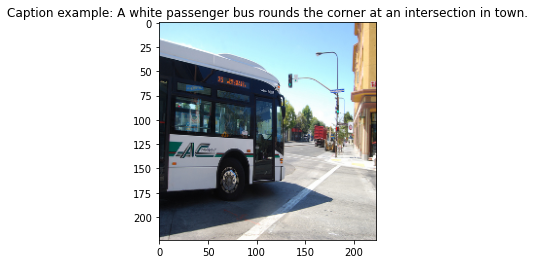

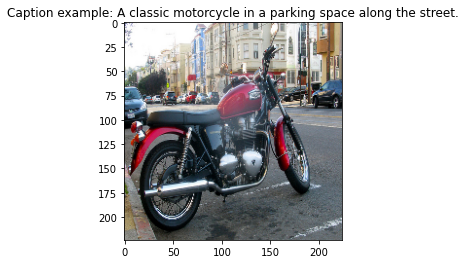

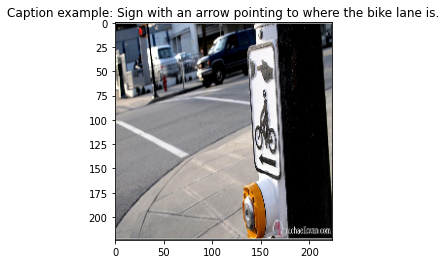

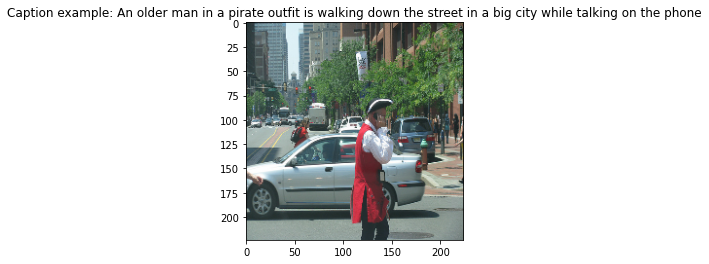

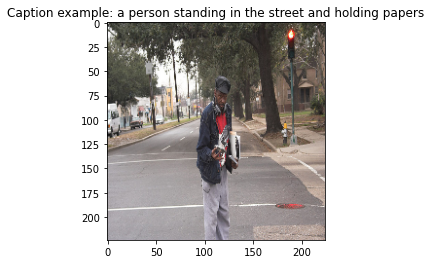

...

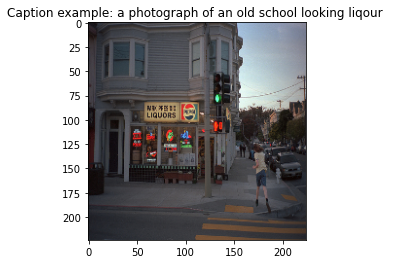

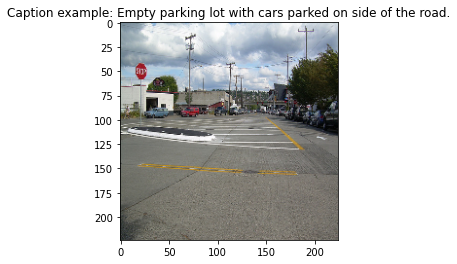

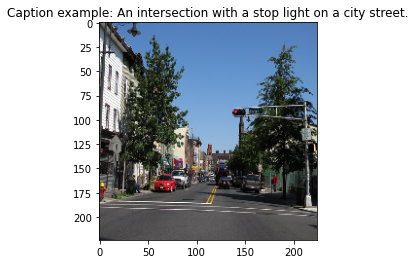

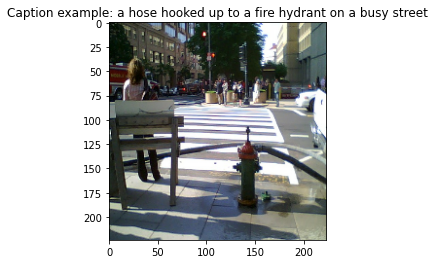

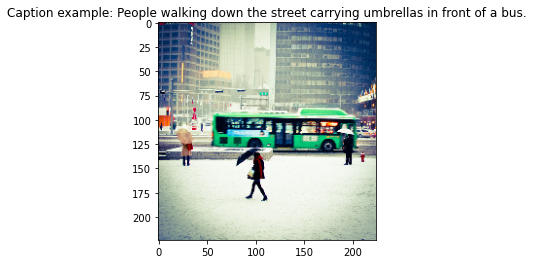

In [ ]:
filtered_dset_loader = DataLoader(dset, batch_size=1, shuffle=False, collate_fn = collate_custom)

for img, y_t, y_all in filtered_dset_loader:
    plt.figure()
    plt.imshow(unorm(img.squeeze().cpu()).permute(1,2,0).numpy())
    plt.title("Caption example: " +str(y_all[0][0]))
    plt.show()
    plt.close()

In [ ]:
model = torch.load(config_exp["path_save_model"])

run_id = '9q82bswx'

if run_id is None:
    raise Exception("Define run_id to continue saving logs in the same experiment.")

In [ ]:
run = wandb.init(project="Image_Captioning", name=f"experiment_{run}", config=config_exp, resume=run_id, id=run_id, settings=wandb.Settings(start_method="thread"), reinit=True, dir=os.getenv("WANDB_DIR", config_exp["path_save_checkpoints"]))

valfiltered_loader = DataLoader(dset, batch_size=1, collate_fn = collate_custom)
columns = ["id", "image", "predicted", "captions (GT)", "BLEU-1","BLEU-2", "BLEU-3", "BLEU-4",  "BLEU (p4) ", "METEOR (mean)", "METEOR (max)"]
mytable = wandb.Table(columns=columns)
bleu_list, bleu_list1, bleu_list2, bleu_list3, bleu_list4, meteor_list, meteor_list_max   = [], [], [], [], [], [], []

with torch.no_grad():
    for idx, (inputs, targets, all_targets) in enumerate(tqdm(valfiltered_loader)):
        model.eval()
        inputs = inputs.to(device)
        decoded_ids = torch.full((inputs.shape[0], 1),
                            model.decoder_start_token_id,
                            dtype=torch.long).to(inputs.device)
            
        for step in range(32):
            output_val =  model(images =  inputs, decoder_ids= decoded_ids)
                
            #print(f"logits.shape: {output_val.logits.shape}")
            val_logits = output_val.logits
            next_token_logits = val_logits[:, -1, :]
            next_token_id = next_token_logits.argmax(1).unsqueeze(-1)
            decoded_ids = torch.cat([decoded_ids, next_token_id], dim=-1)
            #print(f"decoded_ids batch: {decoded_ids}")

            # Check if output is end of senquence for all batches
            if torch.eq(next_token_id[:, -1], model.eos_token_id).all():
                break

        
        eval_preds_sentences = tokenizer.batch_decode(decoded_ids,  skip_special_tokens=True)
        #eval_preds_sentences = list(map(str2,eval_preds_sentences))
        bleu_score, meteor_score, meteor_max = calculate_metrics(eval_preds_sentences, all_targets)
        bleu1 = bleu_score['bp']*math.exp(math.log(bleu_score['precisions'][0]))
        bleu2 = bleu_score['bp']*math.exp(0.5*math.log(bleu_score['precisions'][0])+0.5*math.log(bleu_score['precisions'][1]))
        bleu3 = bleu_score['bp']*math.exp((1/3)*math.log(bleu_score['precisions'][0])+(1/3)*math.log(bleu_score['precisions'][1])+ (1/3)*math.log(bleu_score['precisions'][2]))
        bleu_list.append(bleu_score['score'])
        bleu_list1.append(bleu1)
        bleu_list2.append(bleu2)
        bleu_list3.append(bleu3)
        bleu_list4.append(bleu_score['precisions'][3])
        meteor_list.append(meteor_score)
        meteor_list_max.append(meteor_max)
        mytable.add_data(idx, wandb.Image(unorm(inputs.squeeze().cpu()).permute(1,2,0).numpy()), eval_preds_sentences, all_targets[0], bleu1, bleu2, bleu3, bleu_score['score'], bleu_score['precisions'][3], meteor_score, meteor_max)

       
wandb.log({f"Table_val_categories_filtered_06": mytable})

test_bleu = sum(bleu_list)/len(bleu_list)
test_bleu1 = sum(bleu_list1)/len(bleu_list1)
test_bleu2 = sum(bleu_list2)/len(bleu_list2)
test_bleu3 = sum(bleu_list3)/len(bleu_list3)
test_bleu4 = sum(bleu_list4)/len(bleu_list4)
test_meteor = sum(meteor_list)/len(meteor_list)
test_meteor_max = sum(meteor_list_max)/len(meteor_list_max)

print(f"Test - BLEU-1: {test_bleu1:.4f}/ BLEU-2: {test_bleu2:.4f}/ BLEU-3: {test_bleu3:.4f}/ BLEU-4: {test_bleu:.4f}/ Precision-4: {test_bleu4:.4f}/ METEOR: {test_meteor:.4f} / METEOR (max): {test_meteor_max:.4f}")

epoch,8
train/batch,238
train/batch/bleu_score,17.76108
train/batch/bleu_score_p1,61.45833
train/batch/bleu_score_p2,29.66102
train/batch/bleu_score_p3,12.34568
train/batch/bleu_score_p4,4.42177
train/batch/loss,1.74627
train/epoch/bleu_score,14.33469
train/epoch/bleu_score1,54.23646
train/epoch/bleu_score2,23.99743


  0%|          | 0/178 [00:00<?, ?it/s]

Test - BLEU-1: 74.4131/ BLEU-2: 50.7152/ BLEU-3: 35.0914/ BLEU-4: 25.5899/ Precision-4: 11.5061/ METEOR: 28.5723 / METEOR (max): 45.7790


In [ ]:
eval_preds_sentences

['A large city bus is driving down the street.']

In [ ]:
str2(all_targets)

'[['A large bus on a open city street.', 'Large clock tower overlooking a busy street during the day.', 'Building with the Big Ben Clock overlooking a major street.', 'A crowd of people parked near a double decker bus.', 'A red bus and white van wait in traffic. ']]'

In [ ]:
run = wandb.init(project="Image_Captioning", name=f"experiment_{run}", config=config_exp, resume=run_id, id=run_id, settings=wandb.Settings(start_method="thread"), reinit=True, dir=os.getenv("WANDB_DIR", config_exp["path_save_checkpoints"]))


epoch,8
train/batch,238
train/batch/bleu_score,17.76108
train/batch/bleu_score_p1,61.45833
train/batch/bleu_score_p2,29.66102
train/batch/bleu_score_p3,12.34568
train/batch/bleu_score_p4,4.42177
train/batch/loss,1.74627
train/epoch/bleu_score,14.33469
train/epoch/bleu_score1,54.23646
train/epoch/bleu_score2,23.99743
